## Global signal basic calibration
_Phil Bull, 2023-01-11_

This uses simple differencing, averaging, and smoothing to derive estimates of the bandpass, time-dependent gains, and noise-wave parameters.

In [45]:
import numpy as np
import scipy.optimize
import pylab as plt
import h5py

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel, RBF, Matern

plt.rcParams["figure.figsize"] = (10, 5)

In [46]:
# Settings
prefix = "sim_global_airy_refl"
fname = "%s.hdf5" % prefix

## Calibration assumptions
Values assumed for the calibration loads and noise diode.

In [47]:
# Calibration source assumed temperatures
Tdiode = 60. # K
Tload1 = 293. # K
Tload2 = 393. # K

# How often diode/load are switched in
# Noise diode
diode_cadence = 10
diode_duration = 2

# Load 1
load1_cadence = 200
load1_duration = 10
load1_offset = 50

# Load 2
load2_cadence = 200
load2_duration = 10
load2_offset = 100

## Load data

In [48]:
with h5py.File(fname, 'r') as f:
    
    # Print datasets and attributes
    for field in f.keys():
        print(field)
        for attr in f[field].attrs.keys():
            print("  | %s: %s" % (attr, f[field].attrs[attr]))
    
    # Load data
    d = np.array(f['data'][:])
    d_nodiode = np.array(f['data_nodiode'][:])
    d_onlydiode = np.array(f['data_onlydiode'][:])
    load1 = np.array(f['data_load1'][:])
    load2 = np.array(f['data_load2'][:])
    ndiode_mask = np.array(f['ndiode_mask'][:])
    
    # Reflection coeffs
    Gamma_rec = np.array(f['data_Gamma_rec'][:])
    Gamma_src = np.array(f['data_Gamma_src'][:])
    
    # Freqs/times
    freqs = np.array(f['freqs'][:])
    times = np.array(f['times'][:])
    lsts = np.array(f['lsts'][:])
    
    # Metadata
    obstime = str(f['data'].attrs['obstime'])
    location = str(f['data'].attrs['location'])
    Tdiode = float(f['ndiode_mask'].attrs['Tdiode_Kelvin'])
    
print("")
print("Data shape:", d.shape)
print("Obstime:   ", obstime)
print("Location:  ", location)
print("")
print("Freqs: %6.3f - %6.3f MHz (%d)" % (freqs[0], freqs[-1], freqs.size))
print("LSTs:  %6.3f - %6.3f rad (%d)" % (lsts[0], lsts[-1], lsts.size))
print("Times: %6.3f - %6.3f sec (%d)" % (times[0], times[-1], times.size))

data
  | location: (3822712.88544561, -153832.37979807, 5086301.58702797) m
  | obstime: 2022-10-21 07:59:59.712
  | site_height_m: 77.0
  | site_lat_deg: 53.235002
  | site_lon_deg: -2.3044349
  | units: K
data_Gamma_rec
data_Gamma_src
data_load1
data_load2
data_nodiode
data_onlydiode
freqs
  | units: MHz
lsts
  | units: rad
ndiode_mask
  | Tdiode_Kelvin: 60.0
times
  | units: s

Data shape: (3600, 280)
Obstime:    2022-10-21 07:59:59.712
Location:   (3822712.88544561, -153832.37979807, 5086301.58702797) m

Freqs: 60.000 - 88.000 MHz (280)
LSTs:   2.573 -  3.098 rad (3600)
Times:  0.000 - 7200.000 sec (3600)


## Switching/sampling strategy
Masks that determine when the noise diode and calibration sources are switched in.

In [49]:
def regular_mask(times, cadence, duration, offset=0):
    """
    Construct a mask that has regular structure.
    
    Parameters:
        times (array_like):
            Time sample array.
        cadence (int):
            How often the mask is switched on (no. of samples).
        duration (int):
            How long the mask is switched on for (no. of samples). 
        offset (int):
            Number of samples before the first time the mask is 
            switched on.
    
    Returns:
        mask (array_like):
            Array of integers, 1 or 0.
    """
    mask = np.zeros(times.size, dtype=int)
    for i in range(duration):
        mask[offset+i::cadence] = 1
    return mask

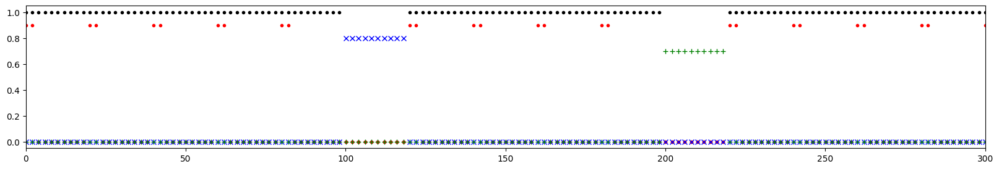

In [50]:
# Noise diode
diode_cadence = 10
diode_duration = 2
mask_ndiode = regular_mask(times, cadence=diode_cadence, duration=diode_duration).astype(bool)

# Load 1
load1_cadence = 200
load1_duration = 10
load1_offset = 50
mask_load1 = regular_mask(times, cadence=load1_cadence, duration=load1_duration, offset=load1_offset).astype(bool)

# Load 2
load2_cadence = 200
load2_duration = 10
load2_offset = 100
mask_load2 = regular_mask(times, cadence=load2_cadence, duration=load2_duration, offset=load2_offset).astype(bool)

# Switch off data (and diode) when load 1 or load 2 is switched in
mask_data = np.ones(times.size, dtype=int).astype(bool)
mask_data[np.logical_or(mask_load1 == True, mask_load2 == True)] = False
mask_ndiode[np.logical_or(mask_load1 == True, mask_load2 == True)] = False

# Plot mask
plt.plot(times, mask_data, 'k.')
plt.plot(times, mask_ndiode*0.9, 'r.')
plt.plot(times, mask_load1*0.8, 'bx')
plt.plot(times, mask_load2*0.7, 'g+')

plt.xlim((0, 300))
plt.gcf().set_size_inches((20., 3.))

## Construct TOD for this switching/sampling strategy

In [51]:
# Combine data from each source into a single timestream
data = np.zeros_like(d)
data[mask_data,:] = d_nodiode[mask_data,:]
data[mask_ndiode,:] += d_onlydiode[mask_ndiode,:]
data[mask_load1,:] = load1[mask_load1,:]
data[mask_load2,:] = load2[mask_load2,:]

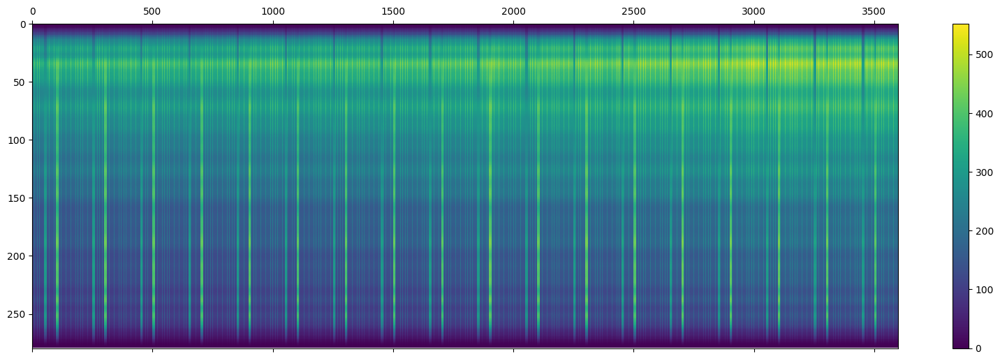

In [52]:
plt.matshow(data.T, aspect='auto')
plt.colorbar()
plt.gcf().set_size_inches((20., 6.))

## Bandpass estimates
Here, we use the noise diode and calibration loads to derive different bandpass estimates.


### Noise diode
The noise diode estimate is differential; we difference between the diode-OFF and diode-ON states at the start and end of the diode-ON periods. The height of this difference should be:

$\Delta P \approx g(\nu, t)\, T_{\rm diode}(\nu, t)\, (1 - |\Gamma_{\rm src}|^2) |\kappa|^2$.

This assumes that the gain, diode temperature, and reflections do not change appreciably between time samples.

In [53]:
def get_chunks(diode_mask):
    ndiode_on_chunks = []
    ndiode_off_chunks = []
    cur_chunk = []
    cur_state = diode_mask[0] # start in the initial state
    
    # Loop over mask elements
    for i in np.arange(diode_mask.size):
        if diode_mask[i] == cur_state:
            # Still in the previous chunk
            cur_chunk.append(i)
        else:
            # New chunk has started; flush the old chunk
            if cur_state == 1:
                ndiode_on_chunks.append(np.array(cur_chunk))
            else:
                ndiode_off_chunks.append(np.array(cur_chunk))
            
            cur_state = diode_mask[i]
            cur_chunk = []
            cur_chunk.append(i)
            
    return ndiode_on_chunks, ndiode_off_chunks

# Get continguous blocks of times where the noise diode is on and off
ndiode_on, ndiode_off = get_chunks(mask_ndiode)

In [54]:
# Calculate bandpass by differencing between neighbouring ON- and OFF-state time 
# samples, for only the leading and trailing samples of the diode-on block
deltas = [] # difference between ndiode on and off states (neighbouring time samples)
t_deltas = [] # time at the boundary between the states
for block in ndiode_on:
    
    if block[0] != 0:
        delta_leading = d[block[0]] - d[block[0]-1]
        deltas.append(delta_leading)
        t_deltas.append(0.5 * (times[block[0]] + times[block[0]-1]))
    
    if block[-1] != times.size-1:
        delta_trailing = d[block[-1]] - d[block[-1]+1]
        deltas.append(delta_trailing)
        t_deltas.append(0.5 * (times[block[-1]] + times[block[-1]+1]))

# Convert to numpy arrays
t_deltas = np.array(t_deltas)
deltas = np.array(deltas)

In [55]:
# Calculate median and standard deviation
bandpass_ndiode_median = np.median(deltas, axis=0)
bandpass_ndiode_std = np.std(deltas, axis=0)

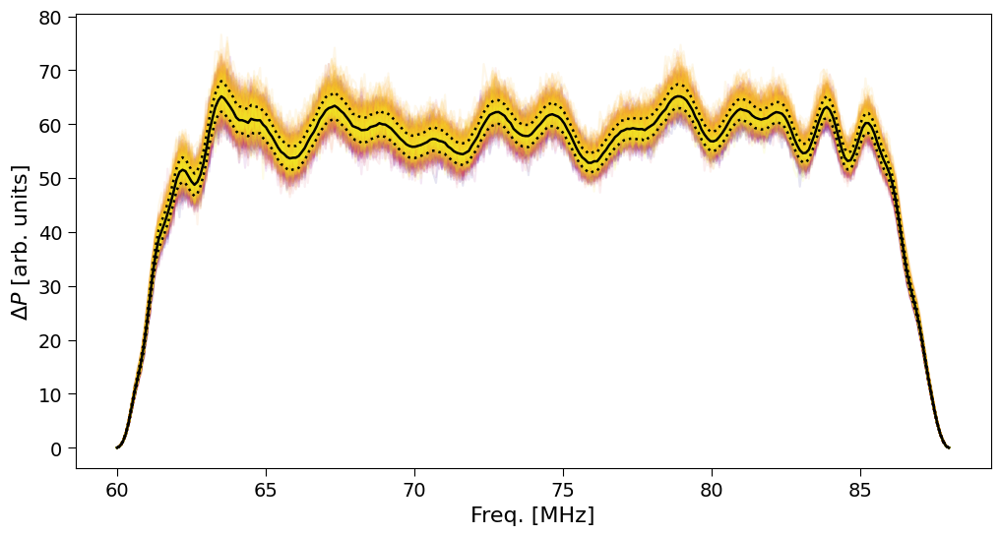

In [56]:
# Use each difference to get a bandpass estimate
# NOTE: This does not factor out the time-dependent gain yet!
cmap = plt.get_cmap("plasma")
for i in range(deltas.shape[0]):
    plt.plot(freqs, deltas[i], color=cmap(i/deltas.shape[0]), alpha=0.1)

plt.plot(freqs, bandpass_ndiode_median, 'k-', lw=1.8)
plt.plot(freqs, bandpass_ndiode_median + bandpass_ndiode_std, 'k:', lw=1.8)
plt.plot(freqs, bandpass_ndiode_median - bandpass_ndiode_std, 'k:', lw=1.8)
    
plt.xlabel("Freq. [MHz]", fontsize=16)
plt.ylabel("$\Delta P$ [arb. units]", fontsize=16)
plt.tick_params(which='both', size=6., labelsize=14)
plt.gcf().set_size_inches((12., 6.))

/tmp/ipykernel_637011/606697283.py:3: RuntimeWarning: invalid value encountered in divide
  _gain_est = deltas / np.median(deltas, axis=0)


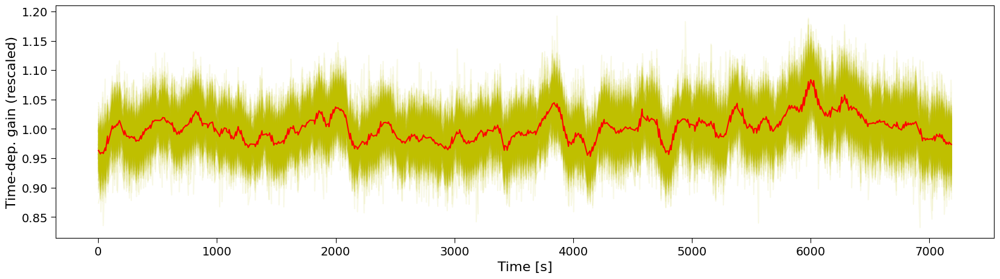

In [57]:
# If we assume that the bandpass is perfectly stable in time, we can derive a time-dep. 
# gain in each frequency channel
_gain_est = deltas / np.median(deltas, axis=0)

# Get mean (ignore edge channels, which give NaN)
_gain_est_mean = np.mean(_gain_est[:,1:-1], axis=1)

plt.subplot(111)
plt.plot(t_deltas, _gain_est, 'y-', alpha=0.1)
plt.plot(t_deltas, _gain_est_mean, 'r-')

plt.ylabel("Time-dep. gain (rescaled)", fontsize=16)
plt.xlabel("Time [s]", fontsize=16)
plt.tick_params(which='both', size=6., labelsize=14)
plt.gcf().set_size_inches((20., 5))

In [58]:
def fit_gaussian_process(t, t_samp, y, corrscale1=0.005, corrscale2=0.1, verbose=True):
    """
    For a smooth Gaussian Process to a set of data points. Useful as 
    an interpolator.
    
    The GP kernel is taken to be the sum of a WhiteKernel, and two RBF 
    kernels with different correlation scales.
    
    Parameters:
        t (array_like):
            Set of times/sample points to interpolate onto.
        t_samp (array_like):
            Set of times/points that the input data were measured at.
        y (array_like):
            Values of the input data at the sample points.
        corrscale1, corrscale2 (float):
            Initial guesses for the correlation scales of the two RBF kernels.
        verbose (bool):
            Whether to print basic information about the GP fits.
    
    Returns:
        y_pred (array_like):
            Predicted values of the data at the sample points given by `t'.
        y_samp (array_like):
            Predicted values at the input sample points.
    """
    # Construct kernel
    kernel = WhiteKernel() + RBF(corrscale1) + RBF(corrscale2)

    # Rescale time coords
    X = np.atleast_2d(t_samp[:]).T / np.max(t_samp)
    gpr = GaussianProcessRegressor(kernel=kernel, normalize_y=True, random_state=0).fit(X, y)
    if verbose:
        print("GPR score (train): %5.3f" % gpr.score(X, y))

    # Predict for trailing-edge samples
    X2 = np.atleast_2d(times).T / np.max(t_samp)
    y2 = gpr.predict(X2, return_std=False)
    y1 = gpr.predict(X, return_std=False)
    if verbose:
        print(gpr.kernel_)
    return y2, y1

GPR score (train): 0.972
WhiteKernel(noise_level=0.0367) + RBF(length_scale=0.00713) + RBF(length_scale=0.0814)


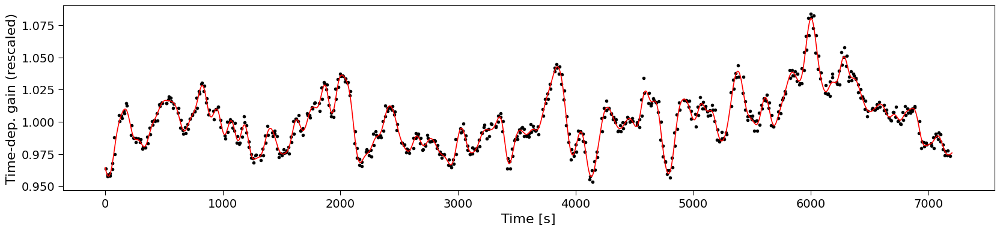

In [59]:
# Apply Gaussian Process smoothing to interpolate over noisy estimate of time-dep. gain
gain_est_mean_gpfit, gain_est_mean_gpfit_tdelta = fit_gaussian_process(times, t_deltas, _gain_est_mean)

# Plot noisy gain estimate and GP-smoothed, interpolated version
plt.subplot(111)
plt.plot(t_deltas, _gain_est_mean, 'k.', lw=1.8)
plt.plot(times, gain_est_mean_gpfit, 'r-', lw=1.2)
#plt.xlim((0., 1000.))

plt.ylabel("Time-dep. gain (rescaled)", fontsize=16)
plt.xlabel("Time [s]", fontsize=16)
plt.tick_params(which='both', size=6., labelsize=14)
plt.gcf().set_size_inches((20., 4.))

/tmp/ipykernel_637011/2257090161.py:30: RuntimeWarning: invalid value encountered in divide
  plt.plot(freqs, bandpass_ndiode_median / bandpass_ndiode_gaincorr_median, 'k-', lw=1.8)


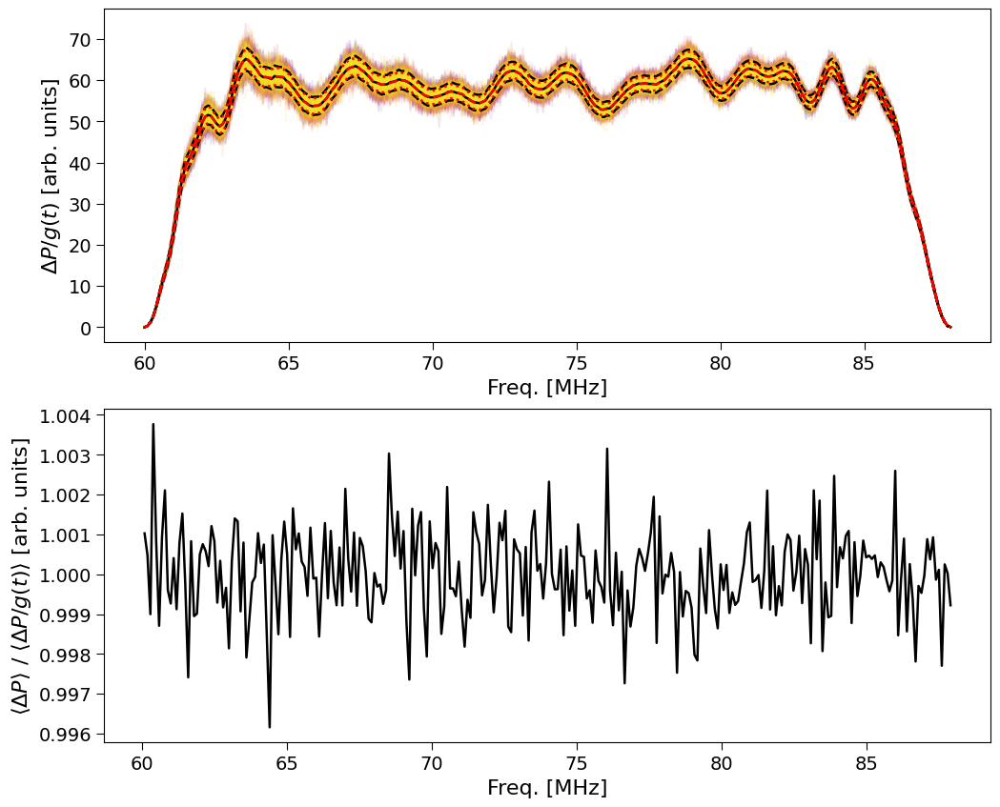

In [60]:
# Rescale bandpass samples by time-dependent gains and try averaging again

# Calculate median and standard deviation after rescaling by time-dep. gain factor
bandpass_ndiode_gaincorr_median = np.median(deltas / gain_est_mean_gpfit_tdelta[:,np.newaxis], axis=0)
bandpass_ndiode_gaincorr_std = np.std(deltas / gain_est_mean_gpfit_tdelta[:,np.newaxis], axis=0)

# Use each difference to get a bandpass estimate, now with time-dep. gain factored out
plt.subplot(211)
cmap = plt.get_cmap("plasma")
for i in range(deltas.shape[0]):
    plt.plot(freqs, 
             deltas[i] / gain_est_mean_gpfit_tdelta[i], 
             color=cmap(i/deltas.shape[0]), 
             alpha=0.1)

plt.plot(freqs, bandpass_ndiode_median, 'k-', lw=1.8)
plt.plot(freqs, bandpass_ndiode_median + bandpass_ndiode_std, 'k--', lw=1.8)
plt.plot(freqs, bandpass_ndiode_median - bandpass_ndiode_std, 'k--', lw=1.8)

plt.plot(freqs, bandpass_ndiode_gaincorr_median, 'r--', lw=1.8)
plt.plot(freqs, bandpass_ndiode_gaincorr_median + bandpass_ndiode_gaincorr_std, 'r:', lw=1.8)
plt.plot(freqs, bandpass_ndiode_gaincorr_median - bandpass_ndiode_gaincorr_std, 'r:', lw=1.8)
    
plt.xlabel("Freq. [MHz]", fontsize=16)
plt.ylabel("$\Delta P / g(t)$ [arb. units]", fontsize=16)
plt.tick_params(which='both', size=6., labelsize=14)


plt.subplot(212)
plt.plot(freqs, bandpass_ndiode_median / bandpass_ndiode_gaincorr_median, 'k-', lw=1.8)

plt.xlabel("Freq. [MHz]", fontsize=16)
plt.ylabel(r"$\langle \Delta P \rangle ~/~ \langle \Delta P / g(t) \rangle$ [arb. units]", fontsize=16)
plt.tick_params(which='both', size=6., labelsize=14)

plt.gcf().set_size_inches((12., 10.))

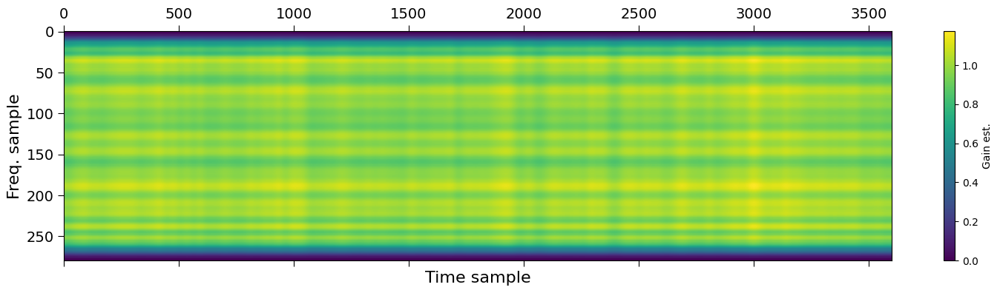

In [61]:
# Reconstruct (bandpass x time-dep. gain) / Tdiode
gain2d_ndiode = bandpass_ndiode_gaincorr_median[:,np.newaxis] \
              * gain_est_mean_gpfit[np.newaxis,:] \
              / Tdiode

plt.matshow(gain2d_ndiode, aspect='auto')
plt.colorbar(label="Gain est.")

plt.xlabel("Time sample", fontsize=16)
plt.ylabel("Freq. sample", fontsize=16)
plt.tick_params(which='both', size=6., labelsize=14)

plt.gcf().set_size_inches((18., 4.))

### Calibration loads

We would like to assume that the calibration loads are time- and frequency-stable (i.e. perfectly spectrally flat), and perfectly impedance-matched, so that the measured power is

$P_{\rm load} \approx g(\nu, t)\, T_{\rm load}\, |\kappa|^2 = g(\nu, t)\, T_{\rm load}\, (1 - |\Gamma_{\rm rec}|^2)$.

If we divide through by the assumed temperature of the load, we therefore get an estimate of the bandpass times the receiver reflection coefficient factor.

In [62]:
# Use calibration loads to get bandpass
load1_on, load1_off = get_chunks(mask_load1)
load2_on, load2_off = get_chunks(mask_load2)

# Extract each set of cal. load observations into an array with the same shape as the data
pload1 = np.zeros_like(data)
for block in load1_on:
    pload1[block,:] = data[block,:]

pload2 = np.zeros_like(data)
for block in load2_on:
    pload2[block,:] = data[block,:]

# Rescale by gain (time-dep. and bandpass)
pload1_scaled = pload1.T / gain2d_ndiode
pload2_scaled = pload2.T / gain2d_ndiode

/tmp/ipykernel_637011/481724590.py:15: RuntimeWarning: invalid value encountered in divide
  pload1_scaled = pload1.T / gain2d_ndiode
/tmp/ipykernel_637011/481724590.py:16: RuntimeWarning: invalid value encountered in divide
  pload2_scaled = pload2.T / gain2d_ndiode


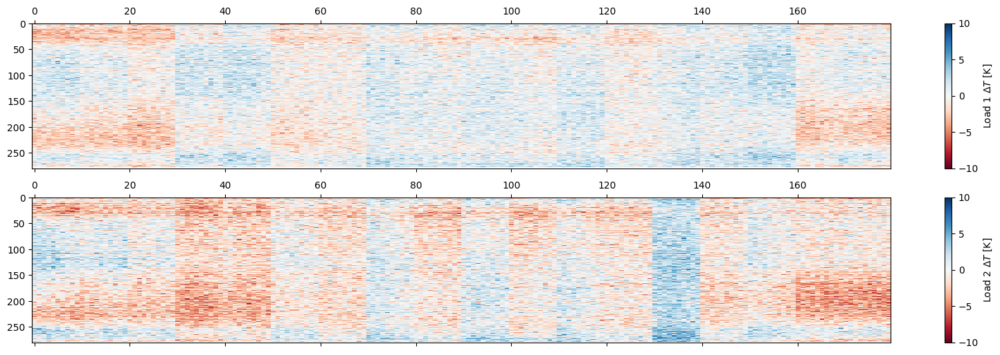

In [63]:
# Plot rescaled calibration load values
# (Concatenates the blocks of time samples where the loads are on)
plt.subplot(211)
plt.matshow(pload1_scaled[:,np.concatenate(load1_on)] - Tload1, 
            aspect='auto', 
            cmap='RdBu', 
            fignum=False,
            vmin=-10.,
            vmax=10.)
plt.colorbar(label="Load 1 $\Delta T$ [K]")

plt.subplot(212)
plt.matshow(pload2_scaled[:,np.concatenate(load2_on)] - Tload2, 
            aspect='auto', 
            cmap='RdBu', 
            fignum=False,
            vmin=-10.,
            vmax=10.)
plt.colorbar(label="Load 2 $\Delta T$ [K]")

plt.gcf().set_size_inches((20., 6.))

### Reflection coefficient measurements

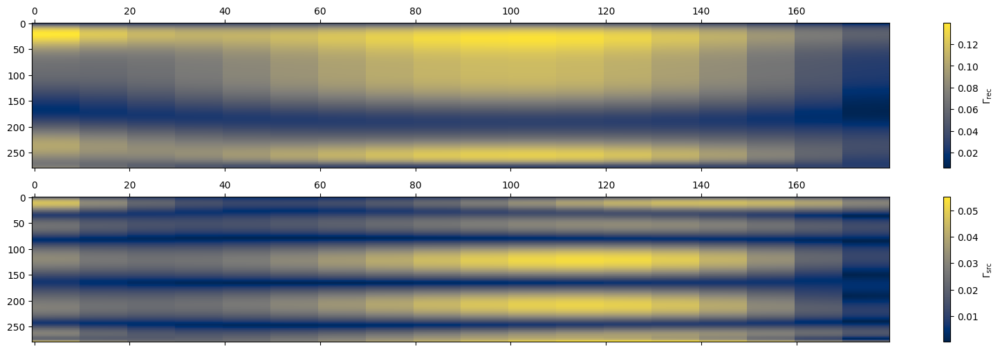

In [64]:
plt.subplot(211)
plt.matshow(np.abs(Gamma_rec.T[:,np.concatenate(load2_on)]), 
            aspect='auto', 
            cmap='cividis', 
            fignum=False
            )
plt.colorbar(label=r"$\Gamma_{\rm rec}$")

plt.subplot(212)
plt.matshow(np.abs(Gamma_src.T[:,np.concatenate(load2_on)]), 
            aspect='auto', 
            cmap='cividis', 
            fignum=False,
            )
plt.colorbar(label=r"$\Gamma_{\rm src}$")

plt.gcf().set_size_inches((20., 6.))

## Foreground removal

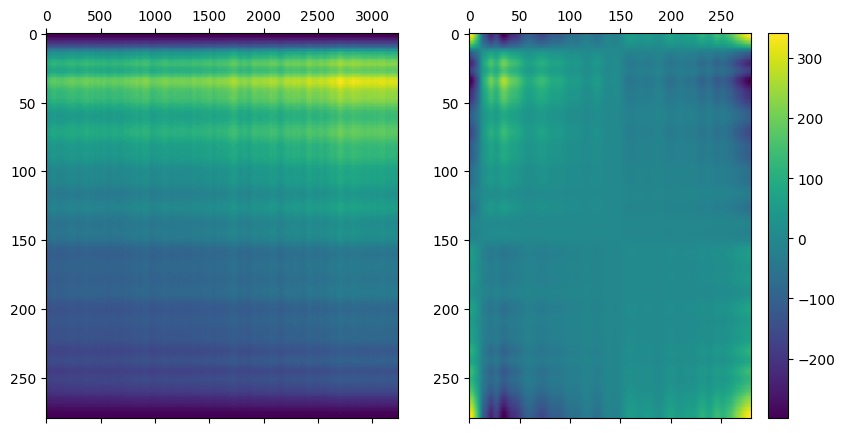

In [65]:
# Choose which data vector to use
# (FIXME: Should use the calibrated data!)
yd = d_nodiode[mask_data,:]

# Calculate the empirical freq.-freq. covariance matrix
ycov = np.cov(yd.T - np.mean(yd, axis=1))
ycov.shape

plt.subplot(121)
plt.matshow(yd.T, aspect='auto', fignum=False)

plt.subplot(122)
plt.matshow(ycov, aspect='auto', fignum=False)
plt.colorbar()

(280, 280)


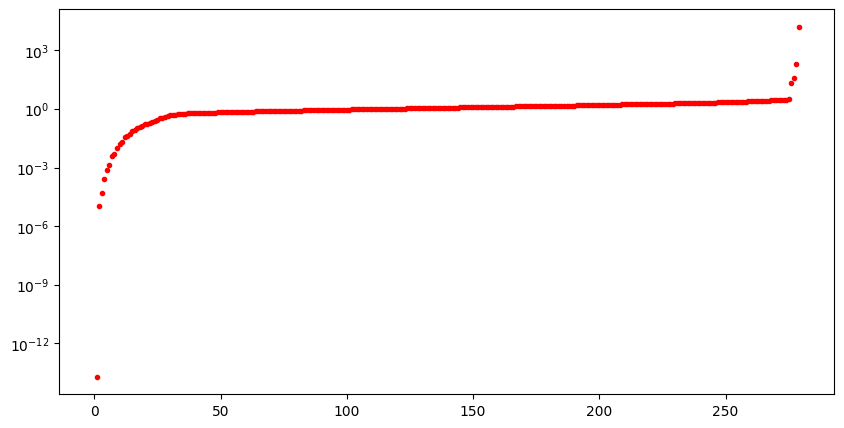

In [66]:
# Do eigenvalue decomposition
yeig, yvec = np.linalg.eigh(ycov)

# Plot eigenvalues
plt.plot(yeig, 'r.')
plt.yscale('log')

print(yvec.shape)

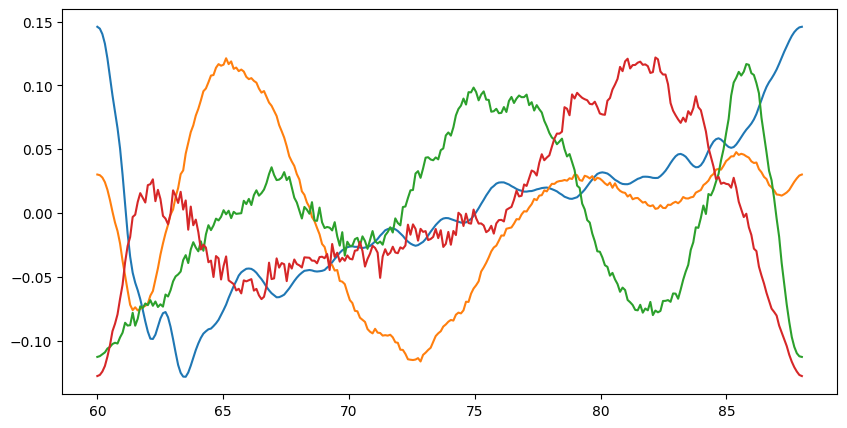

In [67]:
plt.subplot(111)
plt.plot(freqs, yvec[:,-1])
plt.plot(freqs, yvec[:,-2])
plt.plot(freqs, yvec[:,-3])
plt.plot(freqs, yvec[:,-4])

In [68]:
with h5py.File("sim_global_airy_refl.sim.hdf5", 'r') as f:
    
    # Print datasets and attributes
    for field in f.keys():
        print(field)
        for attr in f[field].attrs.keys():
            print("  | %s: %s" % (attr, f[field].attrs[attr]))
    
    d_true = np.array(f['data'][:])
    Tb21_true = np.array(f['Tb21'][:])
    Tdiffuse_true = np.array(f['Tdiffuse'][:])
    Tptsrc_true = np.array(f['Tptsrc'][:])
    input_signal_true = np.array(f['input_signal'][:])
    """
    # Load data
    d = np.array(f['data'][:])
    d_nodiode = np.array(f['data_nodiode'][:])
    d_onlydiode = np.array(f['data_onlydiode'][:])
    load1 = np.array(f['data_load1'][:])
    load2 = np.array(f['data_load2'][:])
    ndiode_mask = np.array(f['ndiode_mask'][:])
    
    # Reflection coeffs
    Gamma_rec = np.array(f['data_Gamma_rec'][:])
    Gamma_src = np.array(f['data_Gamma_src'][:])
    
    # Freqs/times
    freqs = np.array(f['freqs'][:])
    times = np.array(f['times'][:])
    lsts = np.array(f['lsts'][:])
    
    # Metadata
    obstime = str(f['data'].attrs['obstime'])
    location = str(f['data'].attrs['location'])
    Tdiode = float(f['ndiode_mask'].attrs['Tdiode_Kelvin'])
    """
    
print("")
print("Data shape:", d.shape)
print("Obstime:   ", obstime)
print("Location:  ", location)
print("")
print("Freqs: %6.3f - %6.3f MHz (%d)" % (freqs[0], freqs[-1], freqs.size))
print("LSTs:  %6.3f - %6.3f rad (%d)" % (lsts[0], lsts[-1], lsts.size))
print("Times: %6.3f - %6.3f sec (%d)" % (times[0], times[-1], times.size))

Gamma_rec
  | Gamma_rec_freq_amp: 0.5
  | Gamma_rec_freq_ncoeffs: 8
  | Gamma_rec_im0: 0.02
  | Gamma_rec_re0: 0.02
  | Gamma_rec_time_amp: 0.5
  | Gamma_rec_time_ncoeffs: 4
Gamma_src
  | Gamma_src_freq_amp: 0.5
  | Gamma_src_freq_ncoeffs: 8
  | Gamma_src_im0: 0.01
  | Gamma_src_re0: 0.01
  | Gamma_src_time_amp: 0.5
  | Gamma_src_time_ncoeffs: 4
Pload1
Pload2
Tb21
  | units: K
Tdiffuse
  | units: K
Tptsrc
  | units: K
bandpass
  | bandpass_ncoeffs: 50
  | bandpass_ripple_factor: 0.01
  | bandpass_rolloff_scale_high: 1.0
  | bandpass_rolloff_scale_low: 1.0
beam
  | type: airy
beam_az
  | units: deg
beam_za
  | units: deg
data
  | location: (3822712.88544561, -153832.37979807, 5086301.58702797) m
  | obstime: 2022-10-21 07:59:59.712
  | random_seed: 4
  | site_height_m: 77.0
  | site_lat_deg: 53.235002
  | site_lon_deg: -2.3044349
  | units: K
freqs
  | units: MHz
gain_corr
  | gain_corr_beta: -1.1
  | gain_corr_fknee: 0.005
  | gain_corr_scale: 5.0
input_signal
load1
load1_signal
  | Tl

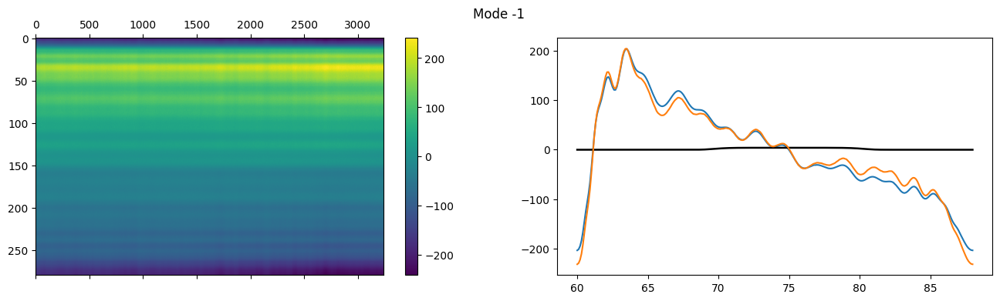

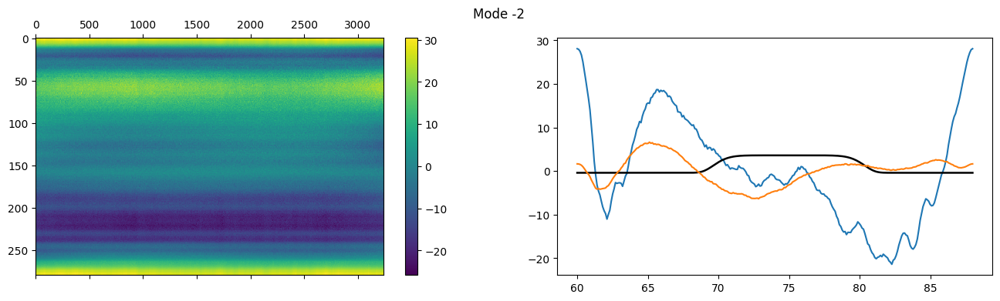

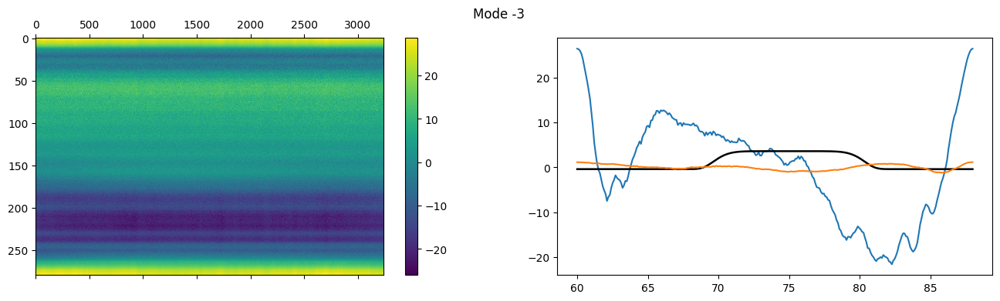

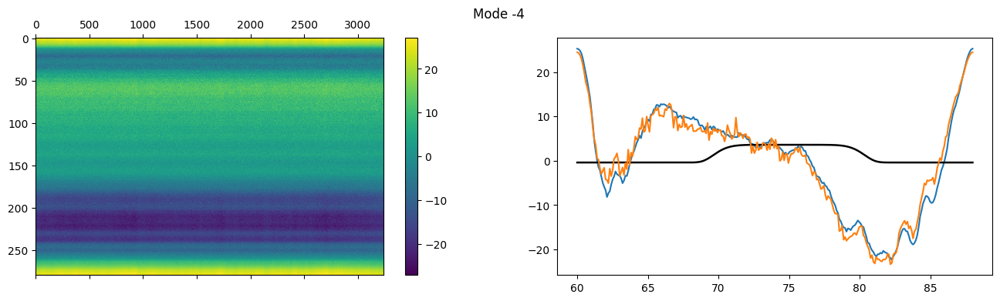

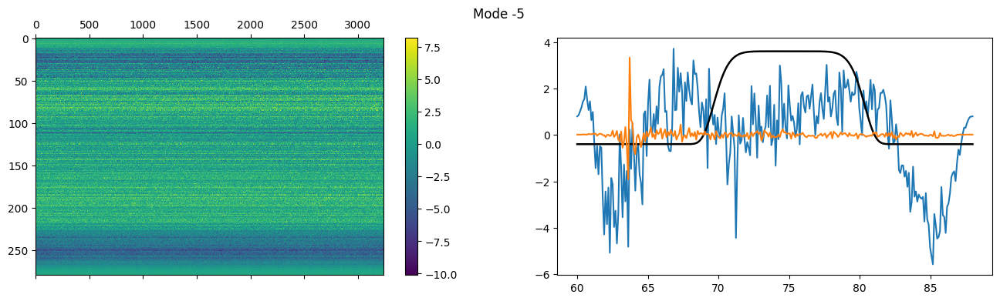

...

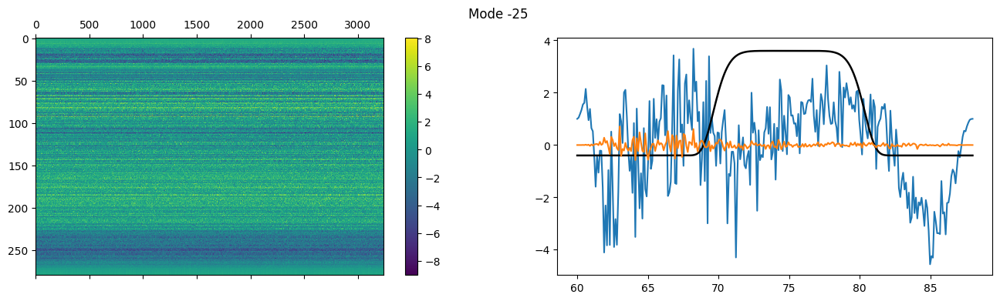

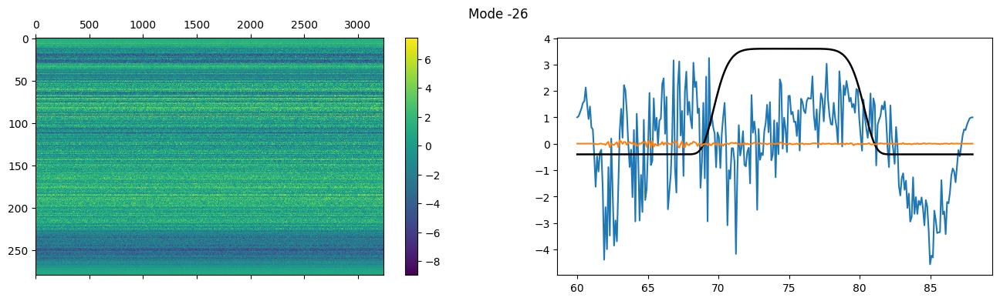

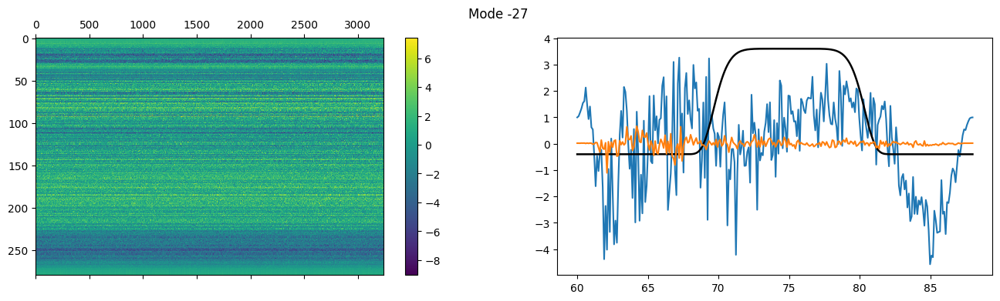

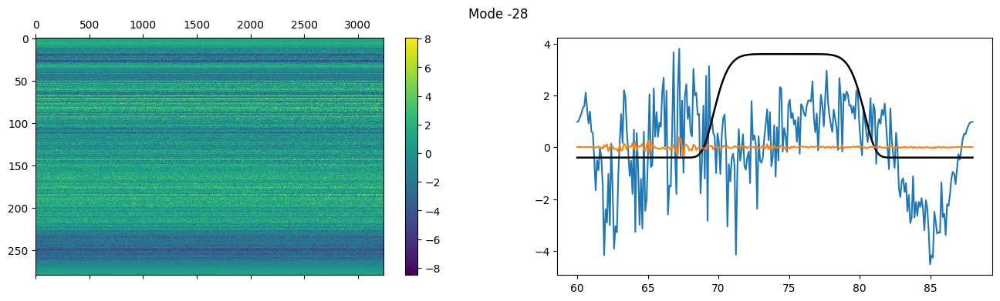

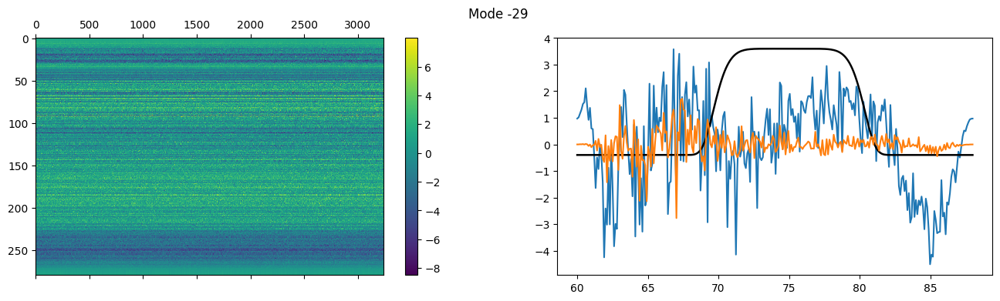

In [69]:
# Subtract off first 2 eigenmodes
resid = yd.T - np.mean(yd, axis=1)
for m in np.arange(-1, -30, -1):
    
    # Get mode amplitude vs time and construct template
    mode_amp = np.dot(yvec[:,m], yd.T)
    template = (mode_amp[:,np.newaxis] * yvec[:,m]).T
    
    # Plot last residual and current template
    plt.subplot(121)
    plt.matshow(resid, aspect='auto', fignum=False)
    plt.colorbar()
    
    plt.subplot(122)
    plt.suptitle("Mode %d" % m)
    plt.plot(freqs, np.mean(resid, axis=1))
    plt.plot(freqs, -40.*Tb21_true, 'k-', lw=1.8)
    try:
        plt.plot(freqs, np.mean(template, axis=1))
    except:
        pass
    
    plt.gcf().set_size_inches((16., 4.))
    plt.show()
    
    # Update residual
    resid = resid - template
    #plt.matshow((mode[:,np.newaxis] * yvec[:,m]).T)
    
    

In [70]:
np.arange(-1, -10, -1)

array([-1, -2, -3, -4, -5, -6, -7, -8, -9])

In [71]:
np.mean(yd, axis=1).shape

(3240,)

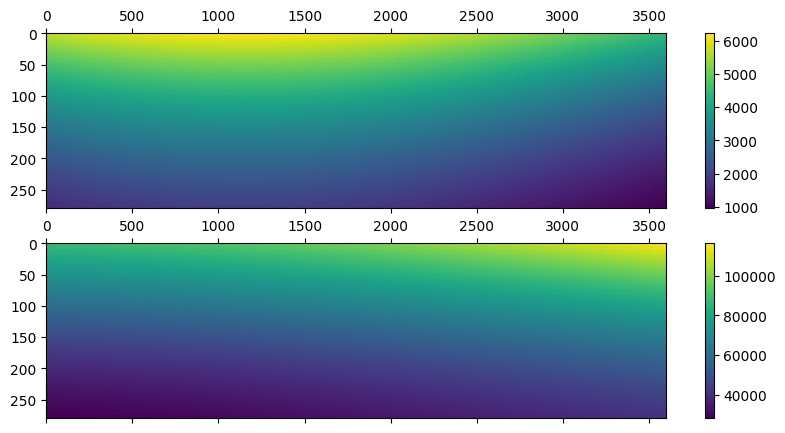

In [72]:
plt.subplot(211)
plt.matshow(Tptsrc_true.real[:,:,0,0], aspect='auto', fignum=False)
plt.colorbar()

plt.subplot(212)
plt.matshow(Tdiffuse_true.real.T, aspect='auto', fignum=False)
plt.colorbar()

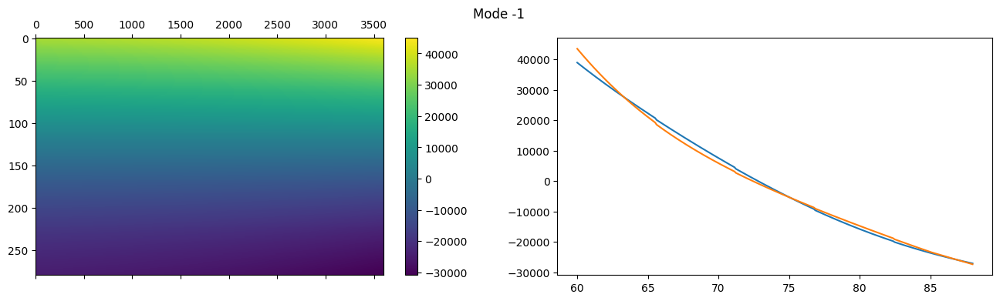

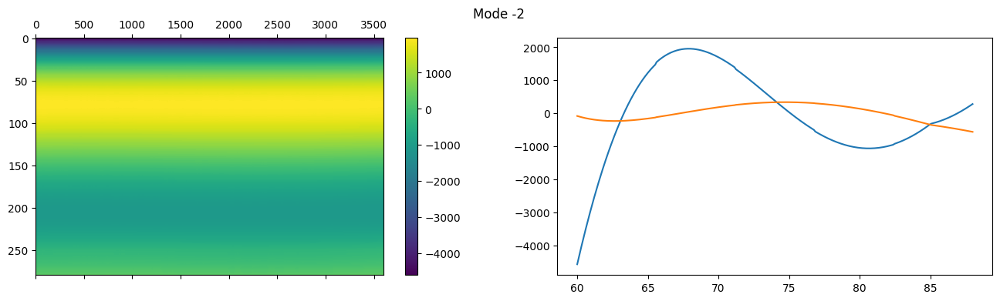

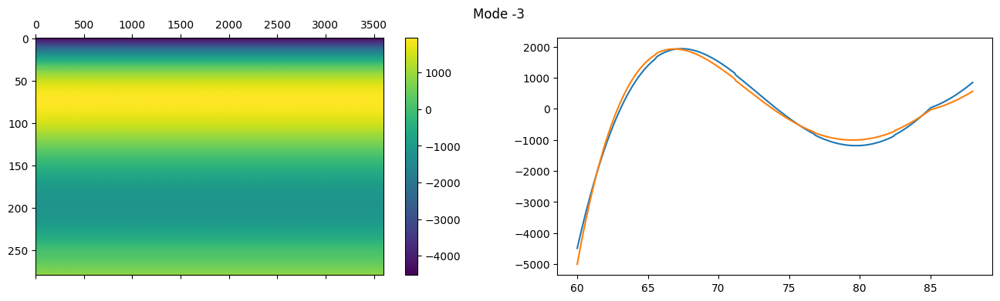

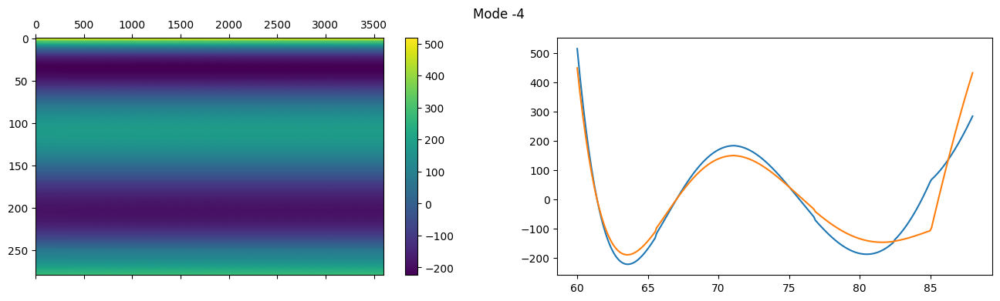

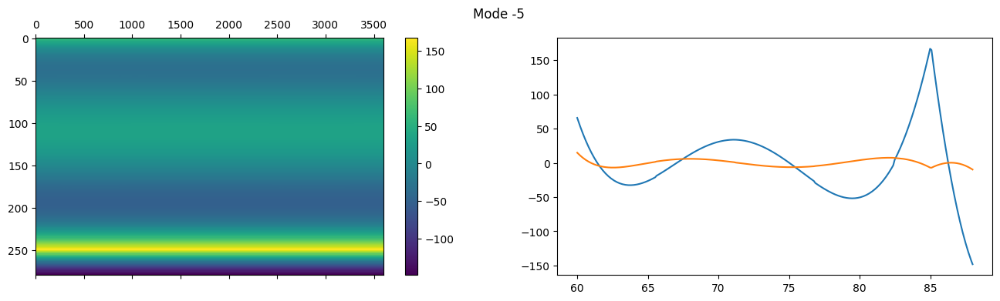

...

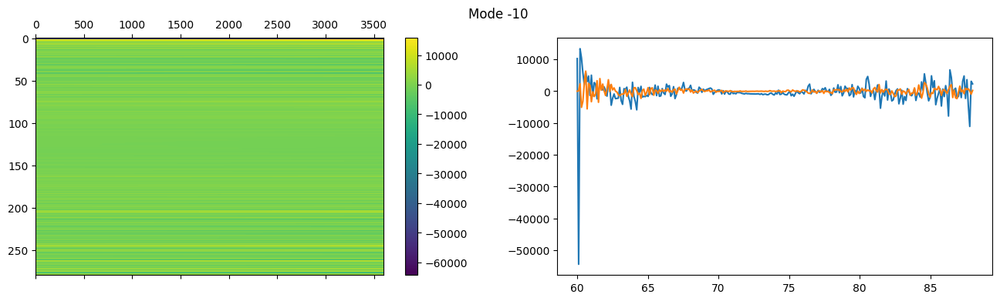

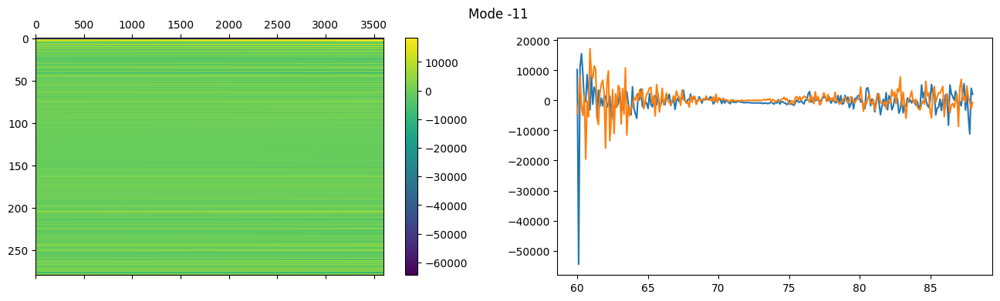

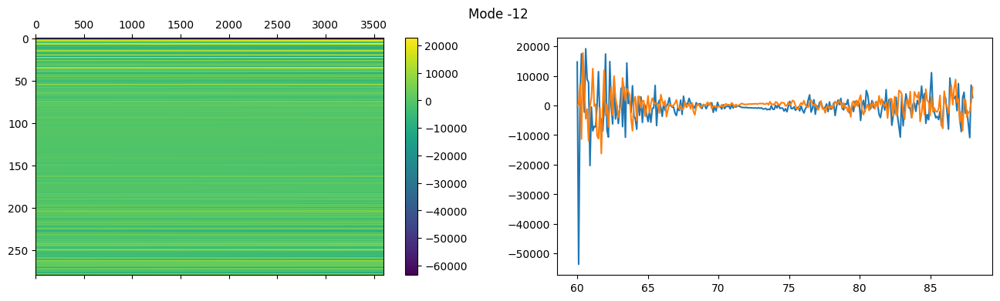

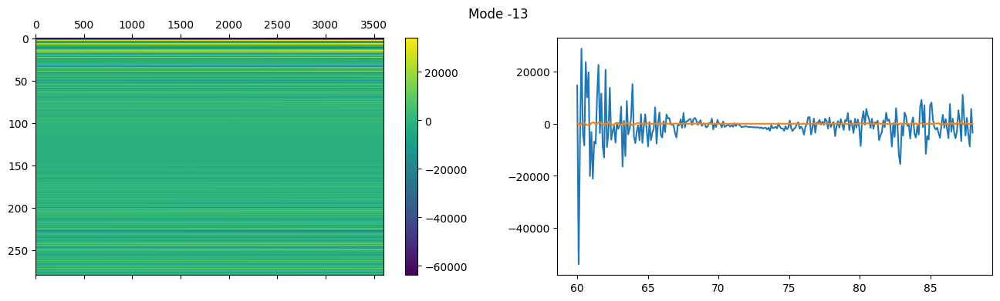

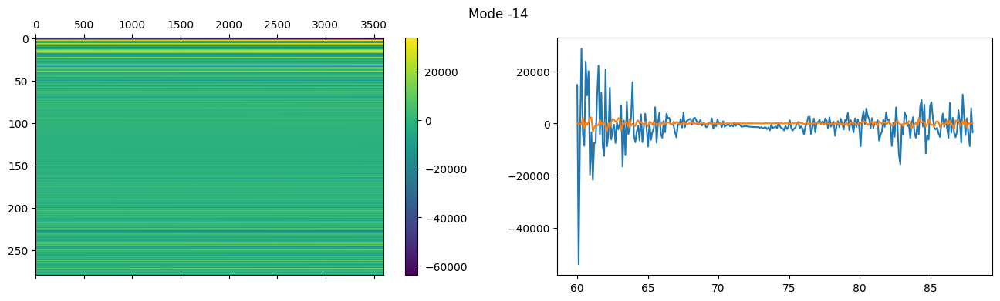

In [73]:
# Get freq-freq covariance eigenmodes
dsky = (0.*Tptsrc_true.real[:,:,0,0] + Tdiffuse_true.real.T + Tb21_true[:,np.newaxis]).T
ycov2 = np.cov(dsky.T - np.mean(dsky, axis=1))
yeig2, yvec2 = np.linalg.eigh(ycov2)


# Subtract off first N eigenmodes
resid = dsky.T - np.mean(dsky, axis=1)
for m in np.arange(-1, -15, -1):
    
    # Get mode amplitude vs time and construct template
    mode_amp = np.dot(yvec2[:,m], dsky.T)
    template = (mode_amp[:,np.newaxis] * yvec2[:,m]).T
    
    # Plot last residual and current template
    plt.subplot(121)
    plt.matshow(resid, aspect='auto', fignum=False)
    plt.colorbar()
    
    plt.subplot(122)
    plt.suptitle("Mode %d" % m)
    plt.plot(freqs, np.mean(resid, axis=1))
    #plt.plot(freqs, -40.*Tb21_true, 'k-', lw=1.8)
    try:
        plt.plot(freqs, np.mean(template, axis=1))
    except:
        pass
    
    plt.gcf().set_size_inches((16., 4.))
    plt.show()
    
    # Update residual
    resid = resid - template

### Fitting power-laws

In [74]:
from scipy.optimize import leastsq

In [75]:
fitting_fn = lambda p: (dsky - (  p[0] * (freqs/70.)**p[1] 
                                + p[2] * (freqs/70.)**p[1] * np.log(freqs/70.)
                                )[np.newaxis,:]).flatten()

In [76]:
# FIXME: Need to do each time separately!
# FIXME: Check noise levels in sims, esp. whether it's above the 21cm level!

# Fit power-law to data
pfit, _ = leastsq(fitting_fn, x0=[1000., -2.7, 1.])

# Residual with best-fit model
_resid = dsky - (  pfit[0] * (freqs/70.)**pfit[1] 
                                + pfit[2] * (freqs/70.)**pfit[1] * np.log(freqs/70.)
                                )[np.newaxis,:]

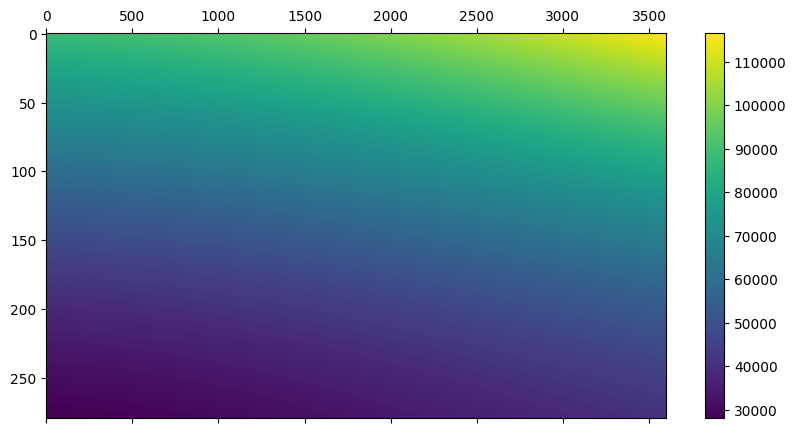

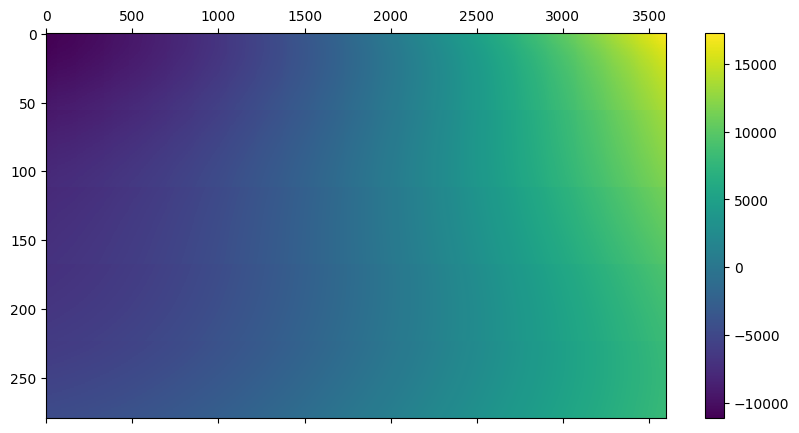

In [77]:
plt.subplot(111)
plt.matshow(dsky.T, fignum=False, aspect='auto')
plt.colorbar()
plt.show()

plt.subplot(111)
plt.matshow(_resid.T, fignum=False, aspect='auto')
plt.colorbar()

    0 /  3600


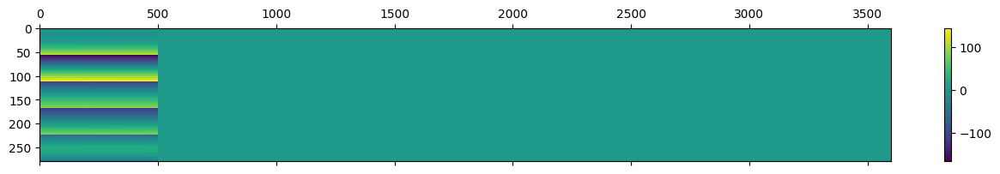

In [78]:
# FIXME: Need to do each time separately!
# FIXME: Check noise levels in sims, esp. whether it's above the 21cm level!

_dsky = (1.*Tptsrc_true.real[:,:,0,0] + 1.*Tdiffuse_true.real.T + Tb21_true[:,np.newaxis]).T
Tmodel = (1.*Tptsrc_true.real[:,:,0,0] + 1.*Tdiffuse_true.real.T).T

_res2d = np.zeros_like(dsky)
#for i in range(dsky.shape[0]):
for i in range(500):
    if i % 1000 == 0:
        print("%5d / %5d" % (i, _dsky.shape[0]))
    _fn = lambda p: _dsky[i] - (  p[1] * (freqs/70.)**p[0] 
                                + p[2] * (freqs/70.)**p[0] * np.log(freqs/70.)
                                + p[3] * (freqs/70.)**p[0] * np.log(freqs/70.)**2.
                                + p[4] * (freqs/70.)**p[0] * np.log(freqs/70.)**3.
                                + p[5] * (freqs/70.)**p[0] * np.log(freqs/70.)**4.
                                )

    # Fit power-law to data
    pfit, _ = leastsq(_fn, x0=[-2.7, 1000., 1., 1., 1., 1.])

    # Residual with best-fit model
    _res2d[i,:] = _fn(pfit)

plt.matshow(_res2d.T, aspect='auto')
plt.colorbar()

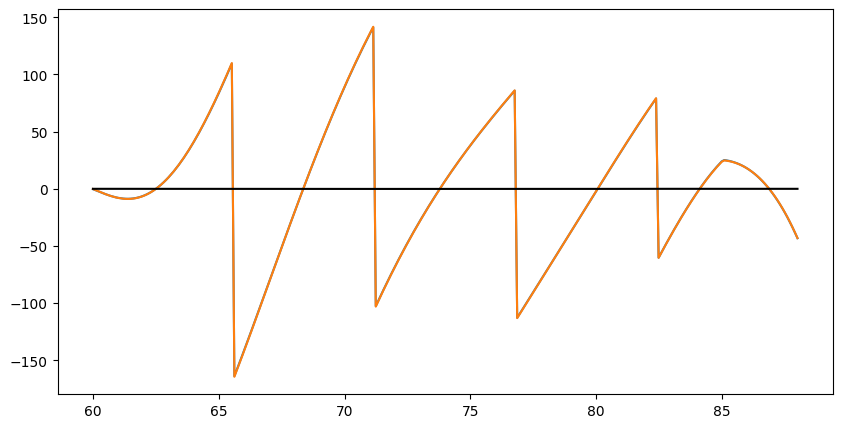

In [79]:
plt.plot(freqs, _res2d[10])
plt.plot(freqs, _res2d[100])
#plt.plot(freqs, _res2d[1000])
plt.plot(freqs, Tb21_true, 'k-')

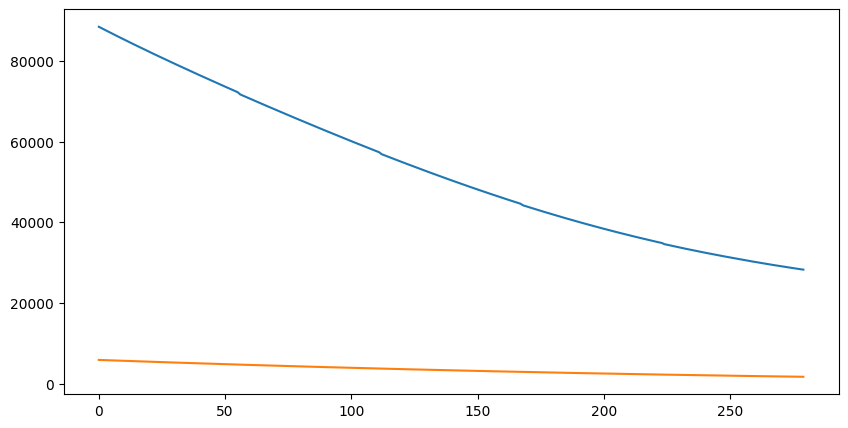

In [80]:
plt.plot(Tdiffuse_true.real[100])
plt.plot(Tptsrc_true.real[:,100,0,0])

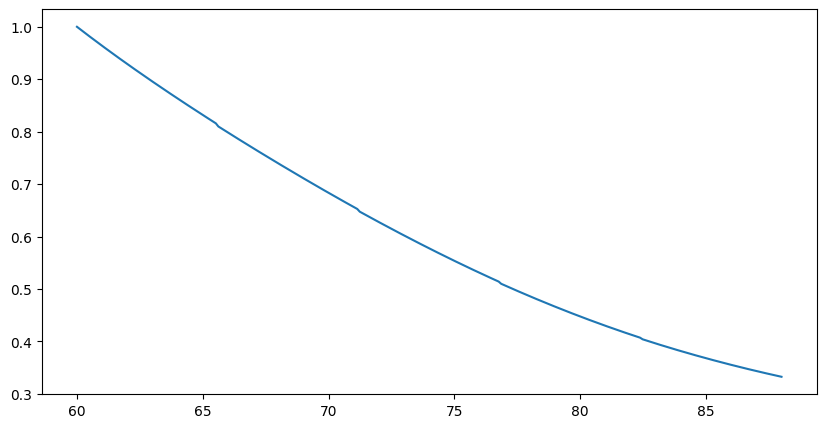

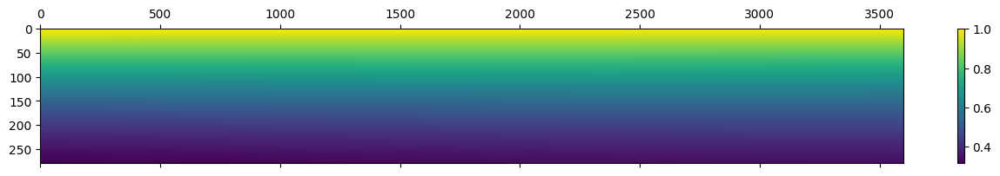

In [81]:
def apply_beam_correction_factor(Tdata, Tmodel, Toffset=0., ref_idx=0, lsts=None):
    """
    
    Parameters:
        Tdata (array_like):
            Data array, of shape (Ntimes, Nfreqs).
        Tmodel (array_like):
            Sky model including beam, with the same shape and 
            corresponding to the same times and frequencies as 
            `Tdata`.
        Toffset (float):
            Constant offset level to shift the data by before 
            applying the beam correction. Normally set `Toffset = Tcmb`.
        ref_idx (int):
            Index of the frequency channel to use as a reference.
    """
    # Calculate B_factor, using Eq. 3.10 of D. Anstey's thesis
    # FIXME: This should vary only the beam factor with frequency, not the sky!
    Bfac = Tmodel[:,:] / Tmodel[:,ref_idx][:,np.newaxis]
    
    # Calculate integral of shifted data divided by beam factor
    # FIXME: This should be a time integral, not a mean
    dt = lsts[1] - lsts[0]
    #Tcorr = np.sum((Tdata - Toffset) / Bfac * dt, axis=0) / (dt * Tdata.shape[0])  + Toffset
    Tcorr = np.mean((Tdata - Toffset) / Bfac, axis=0)  + Toffset
    return Tcorr, Bfac

Tcorr, Bfac = apply_beam_correction_factor(Tdata=_dsky, Tmodel=Tmodel, Toffset=0., ref_idx=0, lsts=lsts)

plt.subplot(111)
#plt.plot(freqs, Tcorr)
plt.plot(freqs, np.mean(_dsky[:,:]/_dsky[:,0][:,np.newaxis], axis=0))
#plt.plot(freqs, 1.+Tb21_true)
plt.show()

plt.matshow(Bfac.T, aspect='auto')
plt.colorbar()


In [82]:
_dsky.shape

(3600, 280)

In [83]:
ls

Global_signal_calibration.ipynb
Global_signal_calibration_new.ipynb
Global_signal_parabolic_reflector_design.ipynb
Global_signal_simulation.ipynb
LICENSE
Makefile
NF_HERA_Vivaldi_power_beam.fits@
README.md
_bess_fit_beam.npy
_bess_fit_coeffs.npy
all.npz
beams.yaml
catBC.txt
make.sh
make_power_beam.py
makeflow.out
matlab_horn_351MHz.dat
matlab_horn_351MHz_az.dat
matlab_horn_351MHz_el.dat
matlab_horn_351MHz_rot.dat
matlab_horn_351MHz_rot_az.dat
matlab_horn_351MHz_rot_za.dat
papermill-8413458.log
papermill-8413504.log
papermill-8413546.log
papermill-8415539.log
papermill-8415807.log
papermill-8415808.log
papermill-8416963.log
papermill-8417031.log
papermill-8417042.log
papermill-8417126.log
papermill-8417127.log
papermill-8425516.log
papermill-8425519.log
papermill-8426028.log
papermill-8426029.log
papermill-8426102.log
papermill-8426105.log
papermill.sh
plot_beam.ipynb
print_UVBeam.py
rhino_calibration.ipynb
rhino_matlab.png
rhino_matlab1.beamfits
rhino_pipe.zip
rhino_sim.ipynb
rhino_uvb